# init and load image

In [35]:
import os
import numpy as np 
from bokeh.plotting import show, output_notebook
import pandas as pd
import socket
import tissue_tag as tt
import matplotlib.pyplot as plt
import scanpy as sc
os.environ['BOKEH_ALLOW_WS_ORIGIN']='*'

output_notebook()

path_to_tissue_tag = ??? # path to tissue tag main folder (e.g. c:/Users/John/Downloads/TissueTag)
host = '8888' # change this port according the the port in address bar (e.g. localhost:5011) - see README
os.chdir(path_to_tissue_tag)
#location of demo data of interest
path = path_to_tissue_tag + '/data/tissue_tag_minimal_example_visium/' 

Loading BokehJS ...

## create de-novo annotations 

Load a visium image and downsample it to a more manageable size. `res_in_ppm` is the desired pixels per micron in the output.

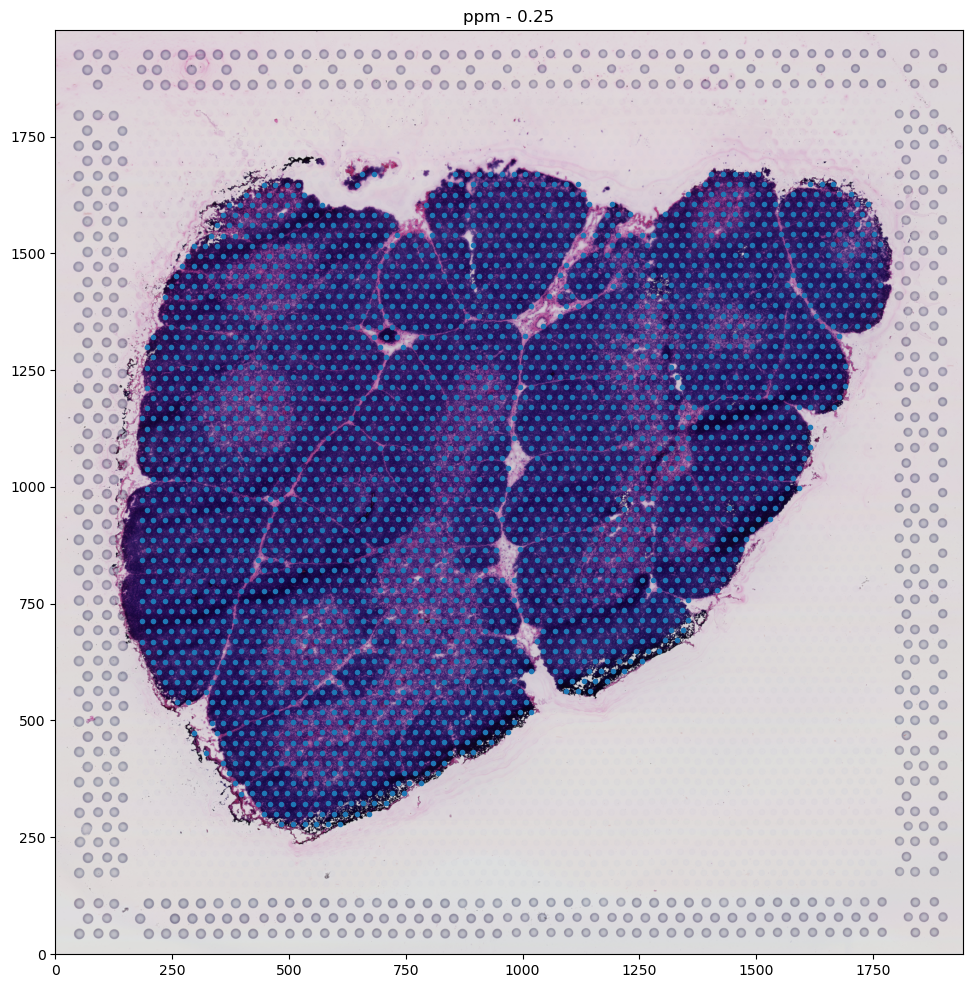

In [36]:
plt.figure(figsize=[12,12])
im,ppm_anno,_ = tt.read_visium(spaceranger_dir_path=path,use_resolution='hires',res_in_ppm=0.25)

Define the morphological structures that we expect to see in the image, along with their corresponding colours. These colours will be used shortly when creating a manual annotation of the image.

In [37]:
# define annotations Lv0 
annodict = {
    'unassigned': 'yellow',
    'Artifacts': 'black',
    'Medulla': 'green',
    'Cortex': 'cyan',
    'Edge': 'brown',
    'HS': 'magenta',
    'Vessels': 'blue',
    'PVS': 'red',
    'Other': 'orange'
}
annotation_image = np.ones((im.shape[0],im.shape[1]), dtype=np.uint8) # blank annotation image


## optional - read previous annotations - 

loaded annotation image - annotations size - (3957, 3886)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}


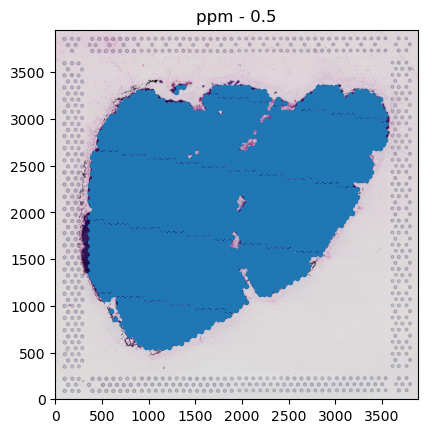

In [38]:
annotation_image, _, ppm_anno, annodict = tt.load_annotation(
    folder=path+'/tissue_annotations/',
    file_name = 'annotations',
    load_colors=True
)
im,ppm_anno,_ = tt.read_visium(spaceranger_dir_path=path,use_resolution='hires',res_in_ppm=ppm_anno)

## Manually draw annotations or correct previuos annotations 

Manually annotate the image with the `annotator` tool:
 - You can draw closed or semi-closed objects in the interactive annotation plot. 
 - it's highly recommened to use a proper mouse and navigate with the zoom wheel funciton 
 - note thay you can flip through tabs of the reference and annotation image
 
 Happy annotating!!
 
*The interactive plot does not show within this static notebook render. see https://github.com/nadavyayon/TissueTag/blob/main/Tutorials/bokeh_plot.png for the output of this codeblock 

In [47]:
rgb = tt.rgb_from_labels(annotation_image,colors=list(annodict.values()))
anno_img = tt.overlay_labels(im,rgb,alpha=0.5,show=False)
tabs,render_dict = tt.annotator(im,anno_img,anno_dict=annodict)
# plotting
def app(doc):
    global tabs
    doc.add_root(tabs)
show(app,notebook_url=f'{socket.gethostname()}:'+host)
print('wait for it.. can take a few tens of seconds on farm... (double time of the former plot)')

wait for it.. can take a few tens of seconds on farm... (double time of the former plot)


## update and plot annotations 

Plot the annotations that were created in the interactive annotation plot.

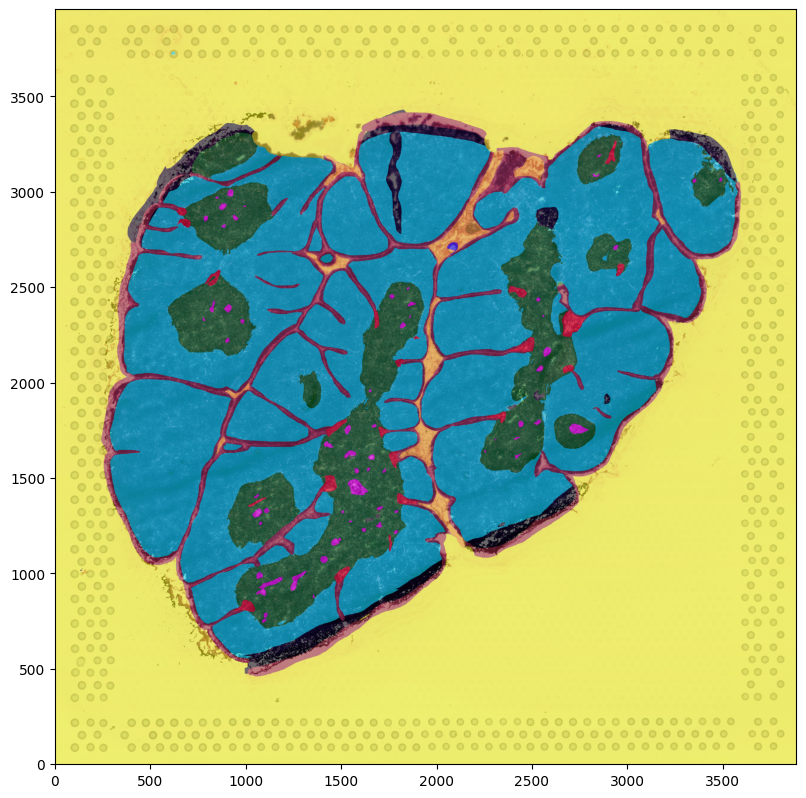

In [8]:
anno_img, annotation_image = tt.update_annotator(im,annotation_image,anno_dict=annodict,render_dict=render_dict,alpha=0.5)
rgb = tt.rgb_from_labels(annotation_image,colors=list(annodict.values()))
anno_img = tt.overlay_labels(im,rgb,alpha=0.5)

## save annotation 

The resulting images and information can be saved for later use.

In [9]:
isExist = os.path.exists(path+'tissue_annotations')
if not(isExist):
    os.mkdir(path+'/tissue_annotations/')
    
tt.save_annotation(
    folder=path+'/tissue_annotations/',
    label_image=annotation_image,
    file_name='annotations',
    anno_names=list(annodict.keys()),
    anno_colors=list(annodict.values()),
    ppm = ppm_anno
)

## load and transfer annotations to grid space

This loads your annotations once you are done and Collapses the annotation 
to a hex grid with spots `spot_diameter` microns wide. This carries a number of advantages:

 - not needing to calculate things on a pixel level is more computationally tractable
 - overcomes potential issues of uneven data density
 - ensures consistent resolution for spatial measurments regurdless of the resolution of the image

Providing the PPM values of the downsampled and original image in reverse recreates the coordinates in the original dimensions.

In [10]:
df_anno,ppm_anno = tt.anno_to_grid(
    folder=path+'/tissue_annotations/',
    file_name = 'annotations',
    spot_diameter = 15,
    load_colors=True,
)

loaded annotation image - annotations size - (3957, 3886)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotations


273504it [00:54, 5013.19it/s]


generate continuous annotations, note that there is a large dependacy of the KNN number you select, you might want to map different annotations to different KNN resolutions 

In [16]:
# remove background spots if you are not interested in it!
df_anno = df_anno.iloc[np.where(df_anno['annotations']!='unassigned')[0],:]
tt.dist2cluster_fast(df_anno,ppm_anno,annotation='annotations',KNN=1) # calculate minimum median distance of each spot to clusters with KNN

calculating distance matrix with cKDTree
Artifacts
Cortex
Edge
HS
Medulla
Other
PVS
Vessels


{'Artifacts': array([1357.62046379, 1372.37676123, 1387.13742696, ...,   40.27768791,
          26.97544794,   16.7526421 ]),
 'Cortex': array([94.69979743, 91.08582999, 89.84887695, ..., 33.4781329 ,
        29.94970703, 33.4783511 ]),
 'Edge': array([0., 0., 0., ..., 0., 0., 0.]),
 'HS': array([1669.34751951, 1659.86878005, 1650.47120804, ...,  185.21752203,
         182.17165999,  180.31939216]),
 'Medulla': array([1318.37449926, 1306.86548103, 1295.4269822 , ...,   66.95648399,
          74.84776225,   83.7269928 ]),
 'Other': array([1202.5529004 , 1203.94791403, 1205.52697879, ...,  870.43145326,
         877.21860661,  884.20702477]),
 'PVS': array([1674.0854666 , 1679.95730953, 1685.941455  , ..., 1326.00776408,
        1323.30475451, 1320.76559058]),
 'Vessels': array([4153.34044502, 4146.24838011, 4139.19823424, ..., 3014.68750037,
        3017.80396875, 3020.99140998])}

Now we can use the hex grid to project back our annotation to the visium spot level. We do this by each spot nearest neighbours in the grid space and take it's annotation. There is a `max_distance` parameter that limits how far away a grid space entry can be from a spot to count as a KNN, in the interest of avoiding annotation artifacts.

The function also creates some simple diagnostic plots of the provided coordinates, allowing for sanity checking that nothing has gone wrong (e.g. axis flips or accidental resolution mismatches).

The output is a data frame that adds the inferred annotation for each spot. `annotations_number` essentially duplicates the information from `annotations`, but in integer form.

Make sure the coordinate systems are aligned, e.g., axes are not flipped.


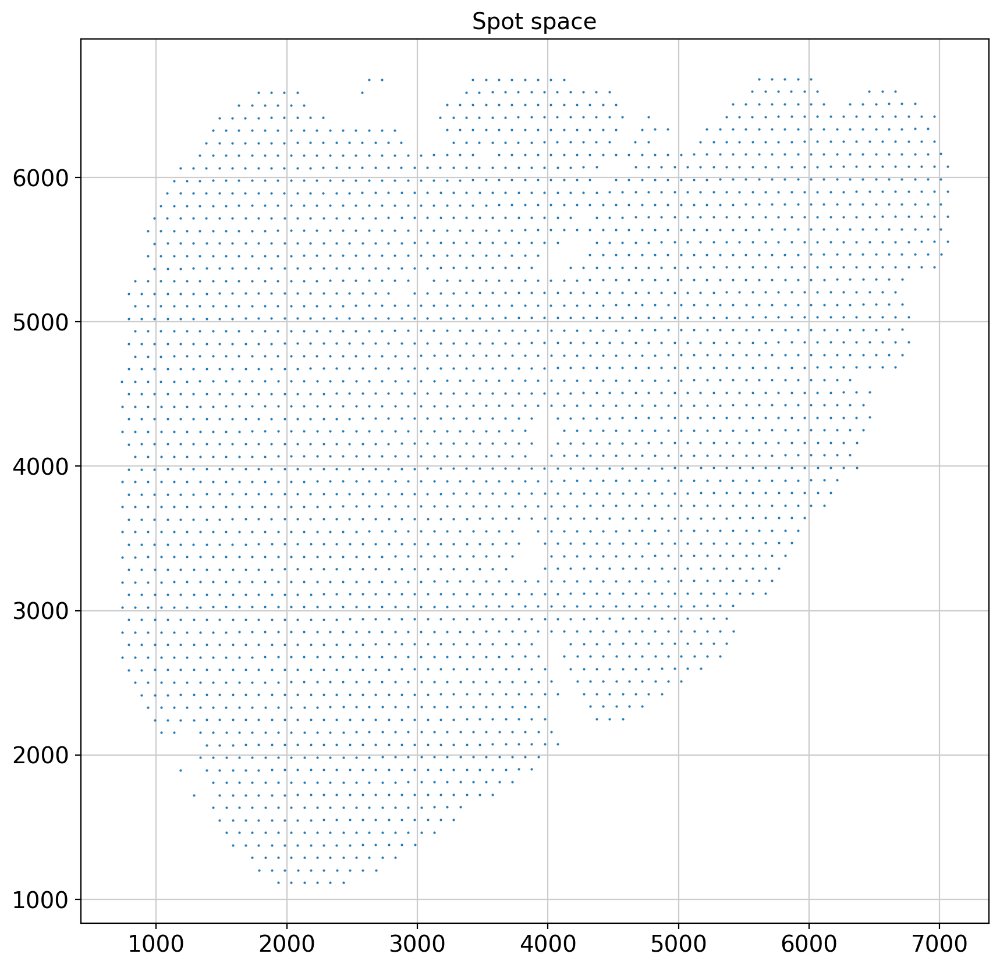

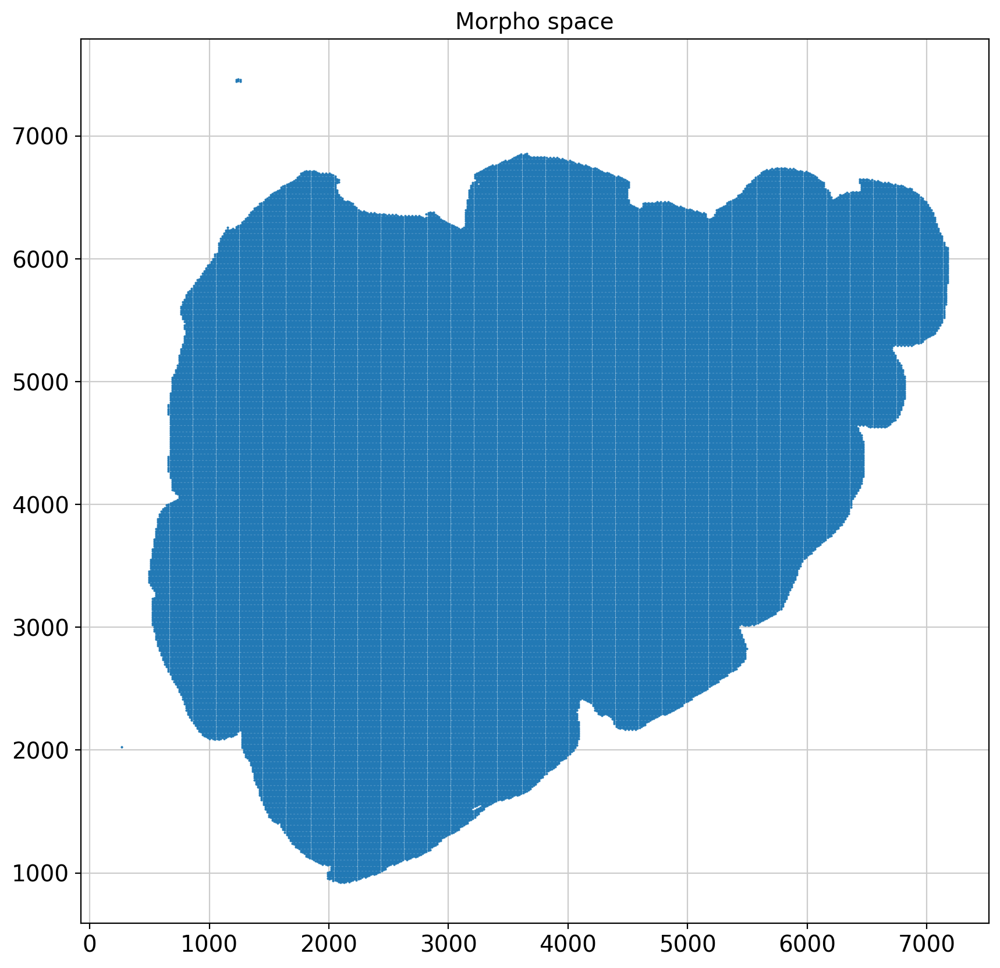

Migrating morphology - annotations to target space.
Migrating morphology - annotations_number to target space.
Migrating morphology - L2_dist_annotations_Artifacts to target space.


/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_spots[k][distances==np.inf] = None
/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_spots[k][distances==np.inf] = None
/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_

Migrating morphology - L2_dist_annotations_Cortex to target space.
Migrating morphology - L2_dist_annotations_Edge to target space.
Migrating morphology - L2_dist_annotations_HS to target space.


/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_spots[k][distances==np.inf] = None
/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_spots[k][distances==np.inf] = None
/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_

Migrating morphology - L2_dist_annotations_Medulla to target space.
Migrating morphology - L2_dist_annotations_Other to target space.
Migrating morphology - L2_dist_annotations_PVS to target space.


/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_spots[k][distances==np.inf] = None
/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_spots[k][distances==np.inf] = None
/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_

Migrating morphology - L2_dist_annotations_Vessels to target space.


/nfs/team205/ny1/ThymusSpatialAtlas/software/git/TissueTag/tissue_tag/tissue_tag.py:1320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df_spots[k][distances==np.inf] = None


In [17]:
# read visium info
_,ppm_vis,vis_df = tt.read_visium(spaceranger_dir_path=path+'/',res_in_ppm=0.25,plot=False)
vis_df.rename(columns={'pxl_col': "x", 'pxl_row': "y"},inplace=True) # for new spaceranger 
vis_df = tt.anno_transfer(
    df_spots=vis_df,
    df_grid=df_anno,
    ppm_grid=ppm_anno,
    ppm_spots=ppm_vis,
    plot=True,
    how='nearest',
    max_distance=100*ppm_vis
)

In [18]:
# read visium full data 
adata_vis = sc.read_visium(path,count_file='raw_feature_bc_matrix.h5')
# map annotations 
adata_vis.obs = pd.concat([adata_vis.obs,vis_df.iloc[:,2:]],axis=1)
adata_vis.obsm['spatial'] = adata_vis.obsm['spatial'].astype('int')
adata_vis

/nfs/team205/ny1/miniconda/miniconda3/envs/imagespot/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 4992 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'annotations', 'annotations_number', 'L2_dist_annotations_Artifacts', 'L2_dist_annotations_Cortex', 'L2_dist_annotations_Edge', 'L2_dist_annotations_HS', 'L2_dist_annotations_Medulla', 'L2_dist_annotations_Other', 'L2_dist_annotations_PVS', 'L2_dist_annotations_Vessels'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

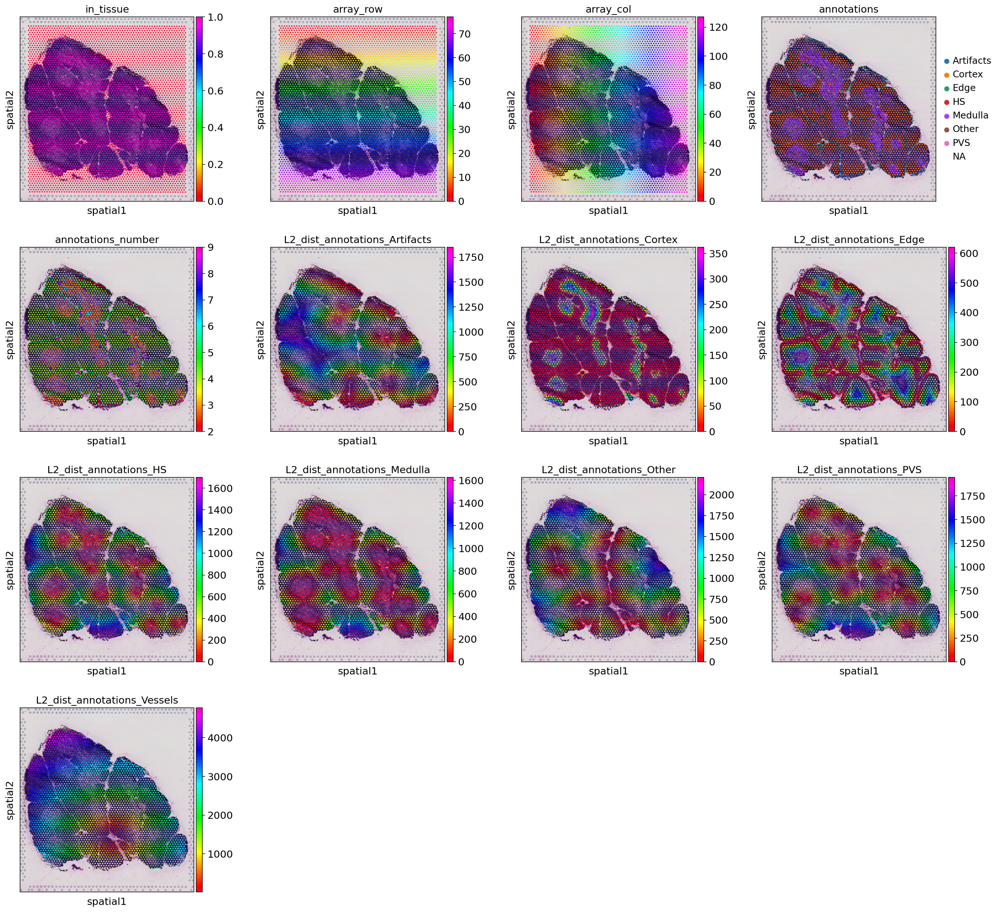

In [19]:
sc.set_figure_params(figsize=[5,5])
sc.pl.spatial(adata_vis,color=adata_vis.obs.columns,cmap='gist_rainbow',ncols=4)